In [1]:
import pandas as pd 
from pandas import DataFrame
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from numpy import where

In [2]:
data = pd.read_csv('average_CQI.csv')

In [3]:

Data = {'x': data['Cell Name'].to_list(), 'y': data['E-UTRAN Average CQI'].to_list()}
df = DataFrame(Data,columns=['x','y'])

In [4]:
x = df[df['y'] == ' '].index

In [5]:
df.drop(x, inplace=True)

In [6]:
df = df.astype({'y': 'float'})

In [7]:
##convert df['y'] from series to numpy_arry
yArr = df['y'].to_numpy()

In [8]:
centerData = len(df['y'])/2

[[ 7.95123239]
 [11.2266185 ]
 [ 9.45050263]]


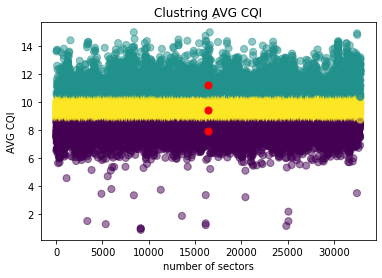

In [9]:
kmeans = KMeans(n_clusters=3).fit(yArr.reshape(-1, 1))
centroids = kmeans.cluster_centers_
df['cluster_num'] = pd.Series((kmeans.labels_)+1, index=df.index) 
print(centroids)

plt.scatter(np.linspace(0,len(df['y']),len(df['y'])), df['y'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter([centerData, centerData, centerData], centroids[:, 0], c='red', s=50)
plt.title('Clustring ِAVG CQI')
plt.xlabel('number of sectors')
plt.ylabel('AVG CQI')
plt.show()

In [10]:
numbersElement = [] 
for i in range(kmeans.n_clusters):
    numbersElement.append(len(where(kmeans.labels_ == i)[0]))
numbersElement    


[10958, 6035, 15883]

In [2]:
###############################################################################################################
####################-------- AVG CQI WITH Over Shooting---------#########################
df1= pd.read_csv('average_CQI.csv')
df2 = pd.read_csv('OvershootingCells.csv')

In [3]:
new_df=df2.merge( df1.set_index('Cell Name'), on='Cell Name')

In [4]:
new_df = new_df.T.drop_duplicates().T

In [14]:
new_df = new_df.T.drop_duplicates().T

In [4]:
#new_df.to_csv('CQI_OVERSHOOTING.csv', index=False, index_label=False)

In [7]:
new_df.drop(["Cell FDD TDD Indication", "Integrity", "L.ChMeas.CQI.DL.0", "L.ChMeas.CQI.DL.1",
             "L.ChMeas.CQI.DL.10","L.ChMeas.CQI.DL.11","L.ChMeas.CQI.DL.12","L.ChMeas.CQI.DL.13","L.ChMeas.CQI.DL.14"
            ,"L.ChMeas.CQI.DL.15","L.ChMeas.CQI.DL.2","L.ChMeas.CQI.DL.3","L.ChMeas.CQI.DL.4"
            ,"L.ChMeas.CQI.DL.5","L.ChMeas.CQI.DL.6","L.ChMeas.CQI.DL.7","L.ChMeas.CQI.DL.8","L.ChMeas.CQI.DL.9"
            ,"ID-OfLocalCell","Date"], axis=1 ,inplace = True)

In [8]:
new_df.to_csv('CQI_OVERSHOOTING.csv', index=False, index_label=False)

In [2]:
###################CLUSTERING CQI WITH MAX INDICATOR##########################
df= pd.read_csv('CQI_OVERSHOOTING.csv')

In [4]:
df.columns

Index(['eNodeB Name', 'Cell Name', 'LocalCell Id', 'E-UTRAN Average CQI',
       'MaxCounter', 'MinDistance', 'MaxDistance', 'Cell_Type',
       'DISTANCE_Threshold', 'AvgSiteToSiteDistance', 'MinOvershoot_Idicator',
       'MaxOvershoot_Idicator', 'OvershootingOnMinIdicator',
       'OvershootingOnMaxIdicator'],
      dtype='object')

In [3]:
Data = {'MaxOvershoot_Idicator': df['MaxOvershoot_Idicator'].to_list(), 'E-UTRAN Average CQI': df['E-UTRAN Average CQI'].to_list()}
df3 = DataFrame(Data,columns=['MaxOvershoot_Idicator','E-UTRAN Average CQI'])

[[ 0.51115788  9.45664779  1.        ]
 [ 0.38629144 11.21888453  3.        ]
 [ 0.69929046  7.96700746  2.        ]]


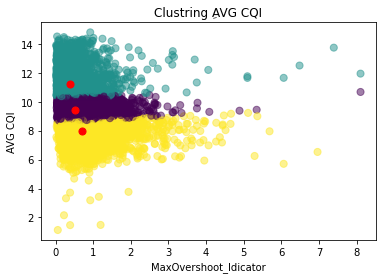

In [15]:
kmeans = KMeans(n_clusters=3).fit(df3)
centroids = kmeans.cluster_centers_
df3['cluster_num'] = pd.Series((kmeans.labels_)+1, index=df3.index) 
print(centroids)

plt.scatter(df3['x'], df3['y'], c= kmeans.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.title('Clustring ِAVG CQI')
plt.xlabel('MaxOvershoot_Idicator')
plt.ylabel('AVG CQI')
plt.show()

In [12]:
from numpy import where
num_Of_Values_in_Cluster = [] 
for i in range(kmeans.n_clusters):
    num_Of_Values_in_Cluster.append(len(where(kmeans.labels_ == i)[0]))
num_Of_Values_in_Cluster    

[5994, 10977, 15730]

In [4]:
##################################################################
def ther_index (data):
    list1=[]
    for i in range(0,len(data)):
        if data.iloc[i]['MaxOvershoot_Idicator']>2 and data.iloc[i]['E-UTRAN Average CQI']<7:
            list1.append(i)
    return list1    

In [5]:
y=ther_index(df3)

In [13]:
df2=pd.DataFrame()
x1=[];y1=[];cell=[]
for i in (y):
    cell.append(df.iloc[i]['Cell Name'])
    x1.append(df.iloc[i]['MaxOvershoot_Idicator'])
    y1.append(df.iloc[i]['E-UTRAN Average CQI'])
df2.insert(0, 'Cell Name', cell, True)    
df2.insert(1, 'MaxOvershoot_Idicator', x1, True)
df2.insert(2, 'ServiceDropRate', y1, True)

In [14]:
df2.to_csv('OvershootingWith_LOWCQI.csv', index=False, index_label=False)

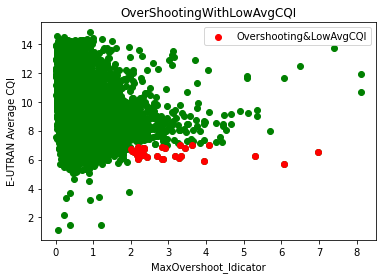

In [6]:
# plotting dataset
plt.scatter(df3.loc[:,'MaxOvershoot_Idicator'], df3.loc[:,'E-UTRAN Average CQI'],color = "green")

for j,i in enumerate(y):
    x2 = df3.iloc[i]['MaxOvershoot_Idicator']
    y2 = df3.iloc[i]['E-UTRAN Average CQI']
    if j==0:
        plt.scatter(x2, y2,color = "red",label='Overshooting&LowAvgCQI')
    else:
        plt.scatter(x2, y2, color = "red") 
plt.title("OverShootingWithLowAvgCQI")
plt.xlabel("MaxOvershoot_Idicator")
plt.ylabel("E-UTRAN Average CQI")
plt.legend()
plt.show()        